# **Исследование рынка заведений общественного питания Москвы и поиск подходящего места для инвестиций**

## **Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 

Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. 

Задача: подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## **Описание данных**

В датасете хранятся данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 
Она носит исключительно справочный характер.

Файл moscow_places.csv содержит следующие столбцы:
- name — название заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- address — адрес заведения;
- district - административный район, в котором находится заведение, например Центральный административный округ;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽»;
 - «Цена чашки капучино: 130–220 ₽»;
 - «Цена бокала пива: 400–600 ₽» и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 - 0 — заведение не является сетевым
 - 1 — заведение является сетевым
- seats — количество посадочных мест.

**Цель исследования** 
1. Выявить наиболее популярные категории заведений.
2. Исследовать доли сетевых и несетевых заведений в датасете.
3. Выявить наиболее популярные районы и улицы Москвы.
4. Посмотреть зависимости от рейтинга заведения.
5. Определить наиболее важные особенности для открытия кофейни. Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 

**Ход исследования**

Данные о заведениях общественного питания в Москве находятся в файле `moscow_places.csv`. В датасете хранятся данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. Поэтому перед исследованием понадобится обзор данных. 

Проверим данные на пропуски и дубликаты, оценим их влияние на исследование. Затем, на этапе предобработки исправим самые критичные ошибки данных.
 
Таким образом, исследование пройдёт в четыре этапа:
 1. Загрузка и изучение данных.
 2. Предобработка данных.
 3. Анализ данных (исследование).
 4. Поиск наиболее подходящего инвесторам места для открытия кофейни.



## ЧАСТЬ 1. Загрузка и изучение данных

Загрузим данные о заведениях общественного питания Москвы.
Путь к файлу: /datasets/moscow_places.csv.


In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Изучим общую информацию о датасете.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод

Ответим на вопросы:
- Сколько заведений представлено? 
- Что можно сказать о каждом столбце? 
- Значения какого типа они хранят?

В данных 8406 строк.

Есть пропуски в столбцах:
- 'hours'
- 'price'
- 'avg_bill'
- 'middle_avg_bill'
- 'middle_coffee_cup'
- 'seats'.

Столбцы содержат текстовые данные, средняя цена, рейтинг, координаты, количество мест - числа. Столбец chain - числовое значение, хотя по сути это категория.

In [5]:
def load_info(df):
    display(df.head())
    print(df.info())
    display(df.describe())
    print('\nДубликаты\n', df.duplicated().sum())

load_info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000



Дубликаты
 0


## ЧАСТЬ 2. Предобработка данных 

Изучим, есть ли дубликаты в данных.

In [6]:
data.duplicated().sum()

0

**Проверка на неявные дубликаты**

In [7]:
data['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

Вывод уникальных наименований дубликатов не выявил, слишком много позиций. Попробуем запустить другие проверки

In [8]:
t = data[data.duplicated(['lat', 'lng'])]
t

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN
273,Pho Oanh,кафе,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100.0
662,Family Cafe Mayak,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN
1074,Халяль Кафе-Пекарня,булочная,"Москва, Анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,100.0
1452,Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2007,Лепим и Варим,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,"ежедневно, 10:00–23:00",55.780218,37.593084,4.4,средние,Средний счёт:400–800 ₽,600.0,NaN,1,500.0
2841,Чайхана Döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN
2866,Dragon Mixology Bar,кафе,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.810949,37.799413,3.8,NaN,NaN,NaN,NaN,0,NaN
2974,Позы&Буузы,кафе,"Москва, Хабаровская улица, 15",Восточный административный округ,"пн-чт 11:00–22:00; пт 11:00–23:00; сб,вс 11:00...",55.822498,37.823358,4.3,NaN,NaN,NaN,NaN,0,75.0


In [9]:
data.query('lat== 55.891936')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
121,Встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN


Проверка по координатам выводит список одинаковых координат, но разных заведений. Т.о., напрашивается вывод, что по одному и тому же адресу находятся разные заведения.

In [10]:
t = data.query('chain == 0')
t = t[t.duplicated(['name'])]
t

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0
159,Кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,Кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,NaN,55.596680,37.725980,4.0,NaN,NaN,NaN,NaN,0,NaN
7938,Кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,NaN,55.604990,37.724762,4.5,NaN,NaN,NaN,NaN,0,NaN
7945,Кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,0,NaN
7976,Кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,0,NaN


Проверка на неявные дубликаты по повторяющимся названиям, которые не являются сетевыми. У всех указан разный адрес, так что не будем их исключать из таблицы.

Поищем пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [11]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [12]:
data = data.fillna(0)

Заполнила пропуски 0, чтобы они не мешали математическим решениям. Удалять заведения, где есть остальные данные (адрес и прочее), по моему мнению не имеет смысла. Они важны для анализа. Там где нулевые значения могут повлиять на расчет средних значений убрала такие строки из датафрейма в каждом конкретном случае расчета.

Выполним предобработку данных:
- Создадим столбец street с названиями улиц из столбца с адресом. 

In [13]:
data['street'] = data['address'].str.split(', ', expand=True, n=2)[1]

- Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
 - логическое значение True — если заведение работает ежедневно и круглосуточно;
 - логическое значение False — в противоположном случае.

In [14]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

### Вывод

Дубликаты отсутствуют, заменили пропуски на 0.

Созданы 2 столбца - с названиями улиц, и сведениями о часах работы 24/7.

## Часть 3. Анализ данных

### Распределение заведений по категориям

In [15]:
t = data.groupby('category').agg({'name':'count'}).sort_values(by=('name'), ascending=True).reset_index()
t

,category,name
0,булочная,256
1,столовая,315
2,быстрое питание,603
3,пиццерия,633
4,"бар,паб",765
5,кофейня,1413
6,ресторан,2043
7,кафе,2378


Text(0, 0.5, 'Количество заведений')

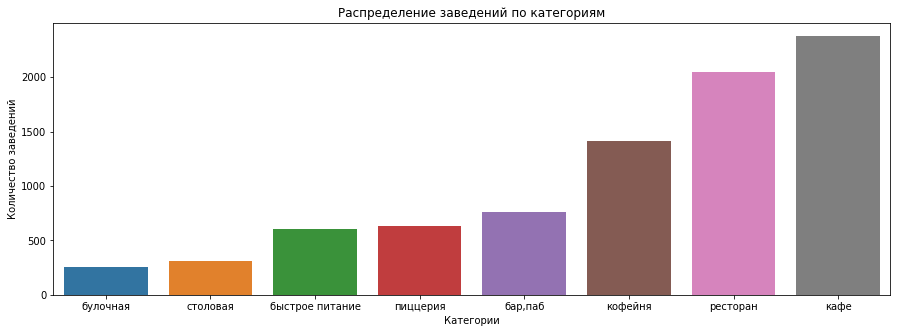

In [16]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='name', data=t)
plt.title('Распределение заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')

### Вывод

Всего  8406 заведений.

Количество заведений по категориям распределилось в следующем порядке:
1. кафе	2378
2. ресторан	2043
3. кофейня	1413
4. бар,паб	765
5. пиццерия	633
6. быстрое питание	603
7. столовая	315
8. булочная	256

Наиболее значительные категории: кафе, рестораны, кофейни.

### Количество посадочных мест по категориям

In [17]:
t = data.groupby('category').agg({'seats':'sum'}).sort_values(by=('seats'), ascending=True).reset_index()
t

,category,seats
0,булочная,13229.0
1,столовая,16359.0
2,быстрое питание,34513.0
3,пиццерия,40350.0
4,"бар,паб",58281.0
5,кофейня,83511.0
6,кафе,118770.0
7,ресторан,154869.0


Text(0, 0.5, 'Количество посадочных мест')

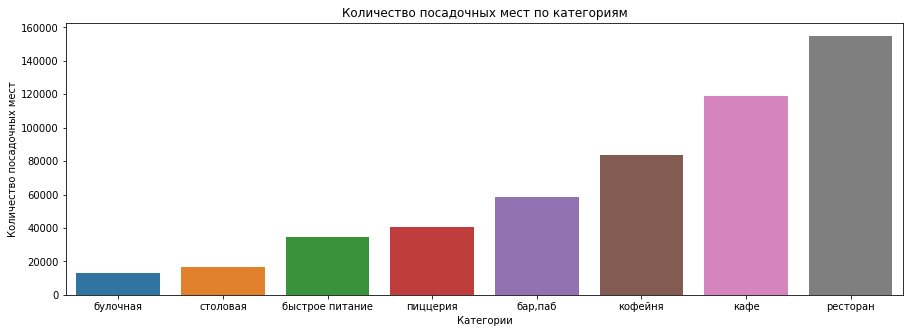

In [18]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='seats', data=t)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')

### Вывод

Наиболее значительные категории по количеству посадочных мест: рестораны, кафе, кофейни.

In [19]:
t = pd.read_csv('/datasets/moscow_places.csv')
t = t.groupby('category').agg({'seats':'median'}).sort_values(by=('seats'), ascending=True).reset_index()
t

,category,seats
0,булочная,50.0
1,пиццерия,55.0
2,кафе,60.0
3,быстрое питание,65.0
4,столовая,75.5
5,кофейня,80.0
6,"бар,паб",82.5
7,ресторан,86.0


Text(0, 0.5, 'Количество посадочных мест')

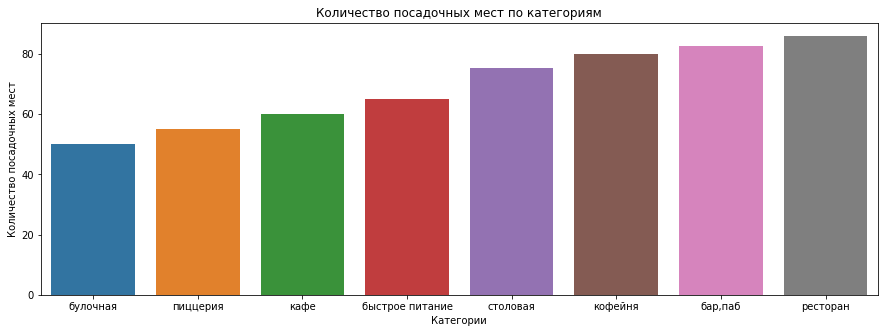

In [20]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='seats', data=t)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')

Медианное значение посадочных мест по категорям лидируют ресторан, бар/паб, кофейня, столовая. Проверка показала, что во всех категориях медианное значение посадочных мест от 50 до 86 шт. 

### Cоотношение сетевых(1) и несетевых(0) заведений в датасете

In [21]:
t = data.groupby('chain').agg({'name':'count'}).sort_values(by=('name'), ascending=True).reset_index()
t

,chain,name
0,1,3205
1,0,5201


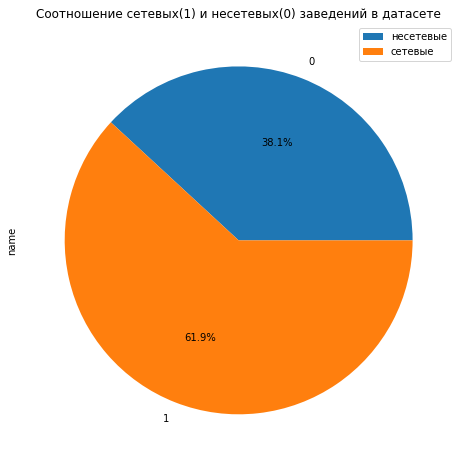

In [22]:
t.plot(y='name', kind='pie', figsize=(8,8), autopct='%1.1f%%')
plt.title('Cоотношение сетевых(1) и несетевых(0) заведений в датасете')
plt.legend(['несетевые', 'сетевые'])

### Вывод

Сетевых заведений в датасете больше. Соотношение следующее: 61,9% - сетевые; 38,1% - несетевые.

### Количество сетевых заведений по категориям

In [23]:
t = data.query('chain == 1').groupby('category').agg({'name':'count'}).sort_values(by=('name'), ascending=True).reset_index()
t

,category,name
0,столовая,88
1,булочная,157
2,"бар,паб",169
3,быстрое питание,232
4,пиццерия,330
5,кофейня,720
6,ресторан,730
7,кафе,779


Text(0, 0.5, 'Количество сетевых заведений')

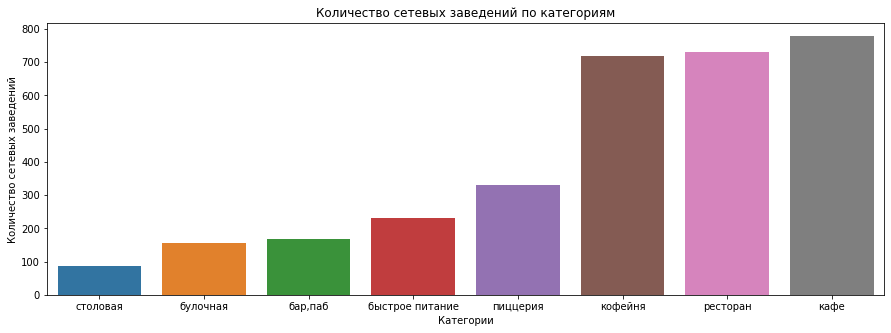

In [24]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='name', data=t)
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество сетевых заведений')

In [25]:
t = data.query('chain == 1').groupby('category').agg({'name':'count'}).sort_values(by=('name'), ascending=True).rename(columns={'name':'chain'})
t['total'] = data.groupby('category').agg({'name':'count'}).sort_values(by=('category'), ascending=False)['name']
t['share'] = t['chain'] / t['total']
t = t.sort_values(by=('share'), ascending=True).reset_index()
t

,category,chain,total,share
0,"бар,паб",169,765,0.220915
1,столовая,88,315,0.279365
2,кафе,779,2378,0.327586
3,ресторан,730,2043,0.357318
4,быстрое питание,232,603,0.384743
5,кофейня,720,1413,0.509554
6,пиццерия,330,633,0.521327
7,булочная,157,256,0.613281


Text(0, 0.5, 'Доля')

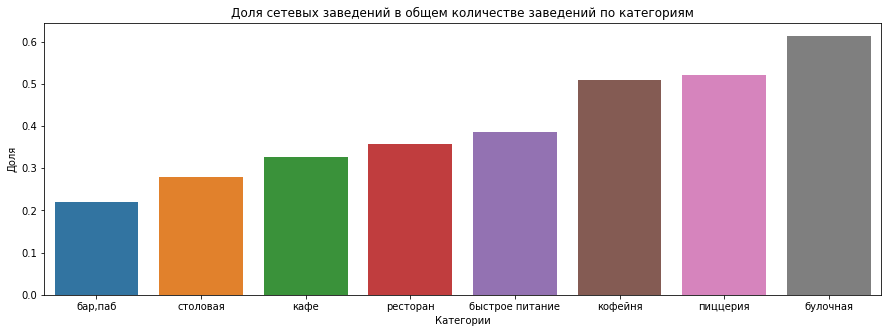

In [26]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='share', data=t)
plt.title('Доля сетевых заведений в общем количестве заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Доля')

### Вывод

Рассчитала долю сетевых заведений в общем количестве заведений. На графике отображено распределение. Лидируют булочная, пиццерия, кофейня. В этих категориях характерно сетевое распределение.

### Количество заведений в сети

In [27]:
t = data.query('chain == 1').groupby(['name', 'category']).agg({'chain':'count'}).sort_values(by=('chain'), ascending=False).reset_index()
t = t.head(15)

t_ = data.groupby('category').agg({'name':'count'}).sort_values(by=('category'), ascending=False)['name'].reset_index()
t = pd.merge(t, t_, on='category', how='inner')
t['share'] = t['chain']/t['name_y']
t = t.sort_values(by=('chain'), ascending=False)


t

,name_x,category,chain,name_y,share
0,Шоколадница,кофейня,119,1413,0.084218
6,Домино'с Пицца,пиццерия,76,633,0.120063
7,Додо Пицца,пиццерия,74,633,0.116904
1,One Price Coffee,кофейня,71,1413,0.050248
8,Яндекс Лавка,ресторан,69,2043,0.033774
2,Cofix,кофейня,65,1413,0.046001
9,Prime,ресторан,49,2043,0.023984
3,КОФЕПОРТ,кофейня,42,1413,0.029724
11,Кулинарная лавка братьев Караваевых,кафе,39,2378,0.016400
10,Теремок,ресторан,36,2043,0.017621


Text(0, 0.5, 'Количество заведений в сети')

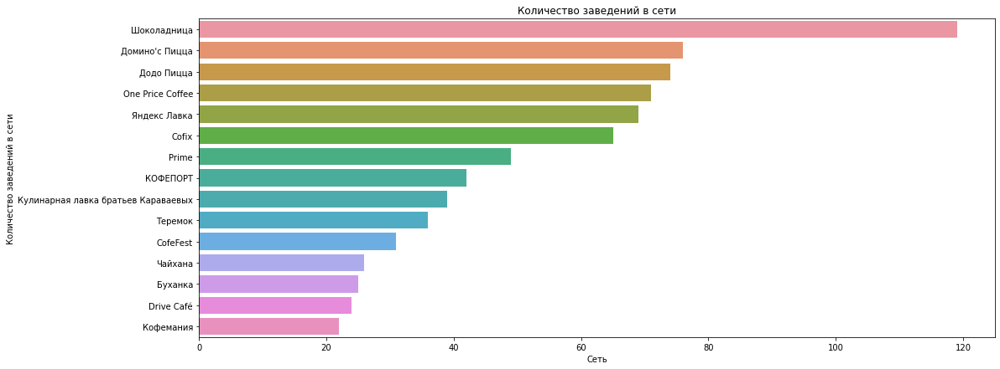

In [28]:
plt.figure(figsize=(17,7))
ax = sns.barplot(x='chain', y='name_x', data=t)
plt.title('Количество заведений в сети')
plt.xlabel('Сеть')
plt.ylabel('Количество заведений в сети')

In [29]:
t = t.sort_values(by=('share'), ascending=False)
t

,name_x,category,chain,name_y,share
6,Домино'с Пицца,пиццерия,76,633,0.120063
7,Додо Пицца,пиццерия,74,633,0.116904
14,Буханка,булочная,25,256,0.097656
0,Шоколадница,кофейня,119,1413,0.084218
1,One Price Coffee,кофейня,71,1413,0.050248
2,Cofix,кофейня,65,1413,0.046001
8,Яндекс Лавка,ресторан,69,2043,0.033774
3,КОФЕПОРТ,кофейня,42,1413,0.029724
9,Prime,ресторан,49,2043,0.023984
4,CofeFest,кофейня,31,1413,0.021939


Text(0, 0.5, 'Доля в своей категории')

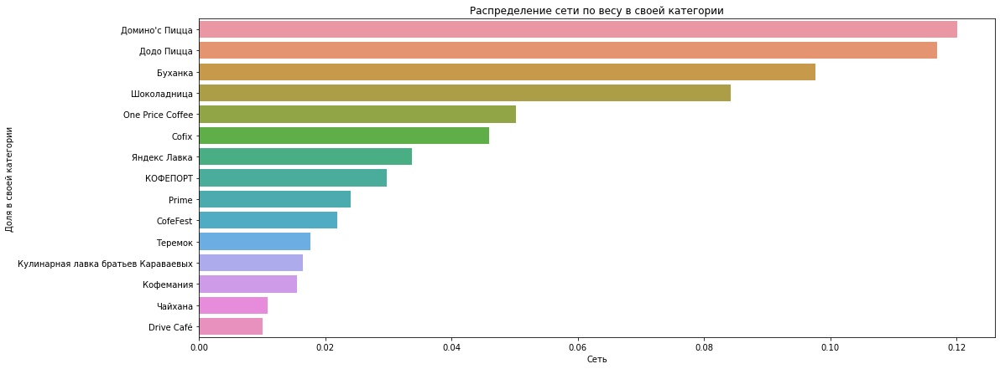

In [30]:
plt.figure(figsize=(17,7))
ax = sns.barplot(x='share', y='name_x', data=t)
plt.title('Распределение сети по весу в своей категории')
plt.xlabel('Сеть')
plt.ylabel('Доля в своей категории')

### Вывод

В топ-15 попали известные сети общепита, которые в основном относятся к категории кофейня и ресторан, также встречается кафе и пиццерия.

Вычислили долю сетевых заведений из ТОП-15 к общему числу заведений в категории. Лидируют пиццерии, булочная и кофейня Шоколадница.

### Административные районы Москвы

In [31]:
t = data.groupby('district').agg({'name':'count'}).sort_values(by=('name'), ascending=False).reset_index()
t

,district,name
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


Text(0, 0.5, 'Районы')

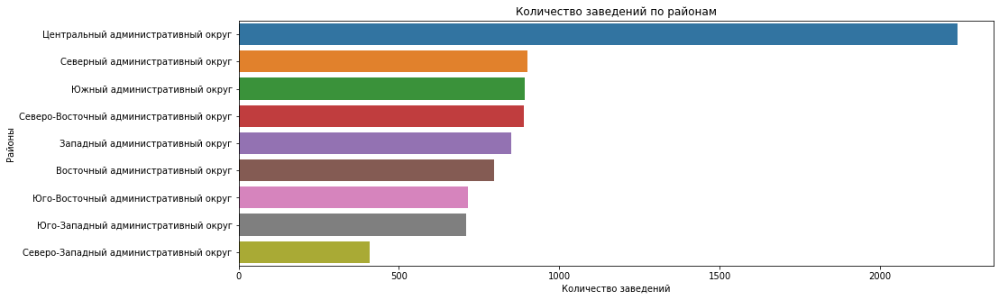

In [32]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='name', y='district', data=t)
plt.title('Количество заведений по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Районы')

### Вывод

По количеству заведений по районам лидирует Центральный административный округ.


### Распределение средних рейтингов по категориям заведений

In [33]:
t = data.groupby('category').agg({'rating':'mean'}).sort_values(by=('rating'), ascending=False).reset_index()
t

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [34]:
# выделим число после запятой для лучшей детализации на графике. Средний рейтинг = 4.
t['share'] = t['rating'] - 4
t

,category,rating,share
0,"бар,паб",4.387712,0.387712
1,пиццерия,4.301264,0.301264
2,ресторан,4.290357,0.290357
3,кофейня,4.277282,0.277282
4,булочная,4.268359,0.268359
5,столовая,4.211429,0.211429
6,кафе,4.123886,0.123886
7,быстрое питание,4.050249,0.050249


Text(0, 0.5, 'Рейтинг (доля среднего значения после запятой)')

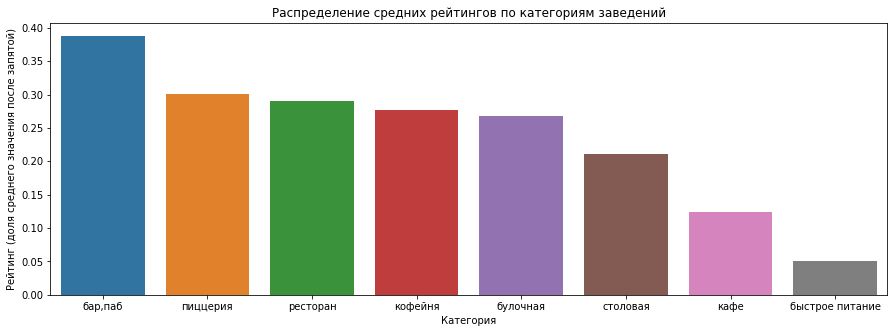

In [35]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='category', y='share', data=t)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг (доля среднего значения после запятой)')

### Вывод

Распределение средних рейтингов по категориям заведений распределилось следующим образом:
1. бар,паб	4.387712
2. пиццерия	4.301264
3. ресторан	4.290357
4. кофейня	4.277282
5. булочная	4.268359
6. столовая	4.211429
7. кафе	4.123886
8. быстрое питание 4.050249    

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [36]:
t = data.groupby('district').agg({'rating':'mean'}).sort_values(by=('rating'), ascending=False).reset_index()
t

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239778
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184417
4,Западный административный округ,4.181551
5,Восточный административный округ,4.174185
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.148260
8,Юго-Восточный административный округ,4.101120


In [37]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=t,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Кластеры

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [39]:
t = data.groupby('street').agg({'name':'count'}).sort_values(by=('name'), ascending=False).reset_index()
t.head(15)

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Text(0, 0.5, 'Улицы')

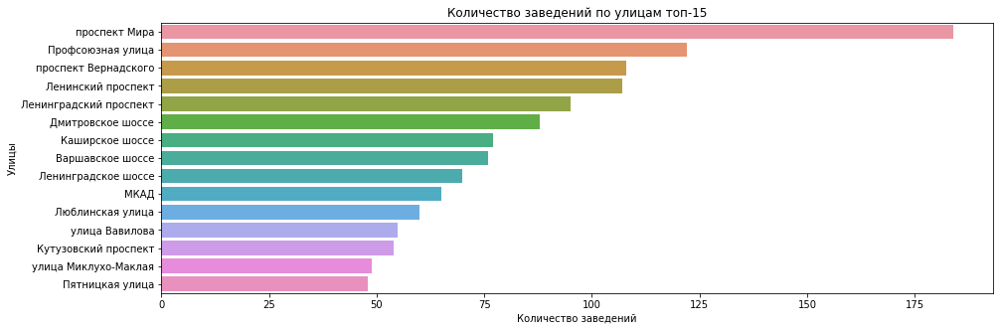

In [40]:
t = t.head(15)
plt.figure(figsize=(15,5))
ax = sns.barplot(x='name', y='street', data=t)
plt.title('Количество заведений по улицам топ-15')
plt.xlabel('Количество заведений')
plt.ylabel('Улицы')

### Вывод 

Топ-15 улиц по количеству заведений:
- проспект Мира	184
- Профсоюзная улица	122
- проспект Вернадского	108
- Ленинский проспект	107
- Ленинградский проспект	95
- Дмитровское шоссе	88
- Каширское шоссе	77
- Варшавское шоссе	76
- Ленинградское шоссе	70
- МКАД	65
- Люблинская улица	60
- улица Вавилова	55
- Кутузовский проспект	54
- улица Миклухо-Маклая	49
- Пятницкая улица	48


### Улицы, на которых находится только один объект общепита

In [41]:
t = data.groupby(['street', 'district']).agg({'name':'count'}).sort_values(by=('name'), ascending=True).reset_index()
t.query('name==1')

,street,district,name
0,1-й Автозаводский проезд,Южный административный округ,1
1,Новощукинская улица,Северо-Западный административный округ,1
2,Новоясеневский тупик,Юго-Западный административный округ,1
3,Одинцовская улица,Северо-Западный административный округ,1
4,Октябрьский переулок,Северо-Восточный административный округ,1
...,...,...,...
471,Васильевская улица,Центральный административный округ,1
472,Весёлая улица,Южный административный округ,1
473,Верхняя улица,Северный административный округ,1
474,Валдайский проезд,Северный административный округ,1


Найдено 476 улиц с одним заведением.

In [42]:
t = t.groupby('district').agg({'street':'count'}).sort_values(by=('street'), ascending=True).reset_index()
t

,district,street
0,Северо-Западный административный округ,76
1,Юго-Западный административный округ,79
2,Западный административный округ,120
3,Юго-Восточный административный округ,134
4,Северный административный округ,150
5,Южный административный округ,152
6,Северо-Восточный административный округ,161
7,Восточный административный округ,165
8,Центральный административный округ,457


Text(0, 0.5, 'Округ')

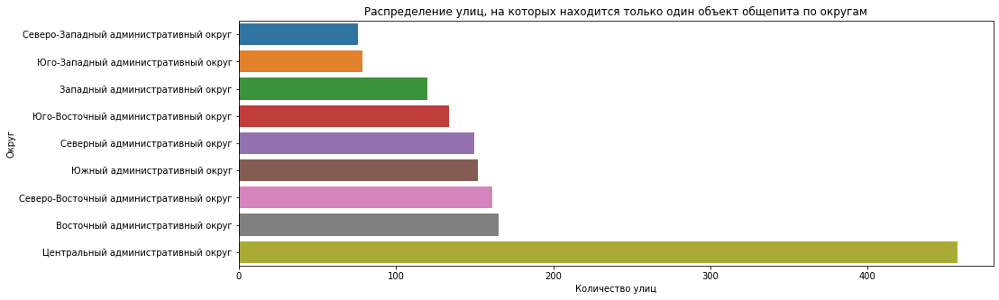

In [43]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='street', y='district', data=t)
plt.title('Распределение улиц, на которых находится только один объект общепита по округам')
plt.xlabel('Количество улиц')
plt.ylabel('Округ')

### Вывод

Найдено 476 улиц с одним заведением.
На графике показано распределение количества улиц по округам.
Большинство улиц, на которых находится только один объект общепита находится в Центральном административном округе.

### Фоновая картограмма (хороплет) для среднего чека заведений по районам

In [44]:
t = data.query('middle_avg_bill != 0')
t = t.groupby('district').agg({'middle_avg_bill':'median'}).sort_values(by=('middle_avg_bill'), ascending=False).reset_index()
t

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [45]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=t,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек в заведениях по районам',
).add_to(m)

# выводим карту
m

### Вывод

1. Распределение заведений по категориям. Всего 8 категорий. Кафе, ресторанов больше всего.


2. Количество посадочных мест по категориям. Также лидируют кафе, рестораны.


3. Cоотношение сетевых(1) и несетевых(0) заведений в датасете. Сетевых заведений больше.


4. Количество сетевых заведений по категориям. В сетевых заведениях также категорий кафе и ресторанов больше.


5. Топ-15 популярных сетей в Москве:
- Шоколадница	кофейня	119
- Домино'с Пицца	пиццерия	76
- Додо Пицца	пиццерия	74
- One Price Coffee	кофейня	71
- Яндекс Лавка	ресторан	69
- Cofix	кофейня	65
- Prime	ресторан	49
- КОФЕПОРТ	кофейня	42
- Кулинарная лавка братьев Караваевых	кафе	39
- Теремок	ресторан	36
- CofeFest	кофейня	31
- Чайхана	кафе	26
- Буханка	булочная	25
- Drive Café	кафе	24
- Кофемания	кофейня	22


6. Административные районы Москвы. Лидирует Центральный административный округ.


7. Распределение средних рейтингов по категориям заведений. Усредненный рейтинг по категория не сильно отличается друг от друга. Все категории распределились в районе от 4.05 до 4.38.


8. Топ-15 улиц по количеству заведений:
- проспект Мира	184
- Профсоюзная улица	122
- проспект Вернадского	108
- Ленинский проспект	107
- Ленинградский проспект	95
- Дмитровское шоссе	88
- Каширское шоссе	77
- Варшавское шоссе	76
- Ленинградское шоссе	70
- МКАД	65
- Люблинская улица	60
- улица Вавилова	55
- Кутузовский проспект	54
- улица Миклухо-Маклая	49
- Пятницкая улица	48


9. Улицы, на которых находится только один объект общепита. Найдено 458 улиц с одним заведением.


10. Средний чек заведений по районам лидирует в Западном административном округе (1000.0) и Центральном административном округе (1000.0).


## Часть 4. Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [46]:
t = data.query('category == "кофейня"').groupby('category').agg({'name':'count'}).sort_values(by=('name'), ascending=True).reset_index()
t

,category,name
0,кофейня,1413


In [47]:
t = data.query('category == "кофейня"').groupby(['category', 'district']).agg({'name':'count'}).sort_values(by=('name'), ascending=False).reset_index()
t

,category,district,name
0,кофейня,Центральный административный округ,428
1,кофейня,Северный административный округ,193
2,кофейня,Северо-Восточный административный округ,159
3,кофейня,Западный административный округ,150
4,кофейня,Южный административный округ,131
5,кофейня,Восточный административный округ,105
6,кофейня,Юго-Западный административный округ,96
7,кофейня,Юго-Восточный административный округ,89
8,кофейня,Северо-Западный административный округ,62


Больше всего кофеен в Центральном, Северном и Северно-восточном районах.

Text(0, 0.5, 'Районы')

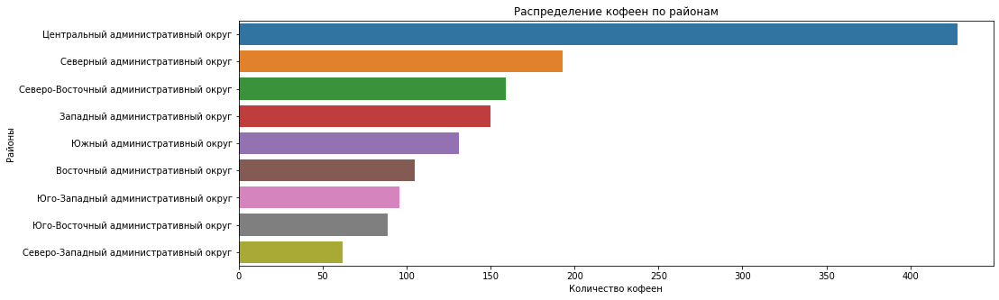

In [48]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='name', y='district', data=t)
plt.title('Распределение кофеен по районам')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')

### Есть ли круглосуточные кофейни?

In [49]:
t = data.query('category == "кофейня"')
t = t['is_24/7'].value_counts().reset_index()
t

,index,is_24/7
0,False,1339
1,True,59


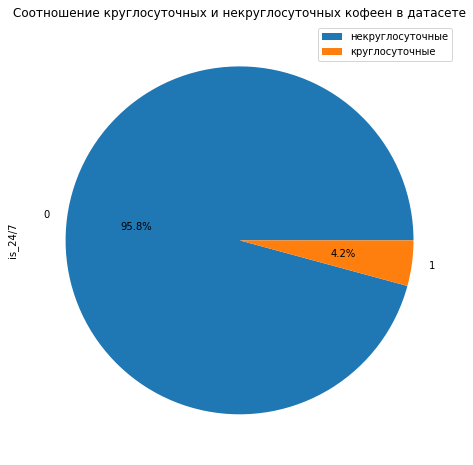

In [50]:
t.plot(y='is_24/7', kind='pie', figsize=(8,8), autopct='%1.1f%%')
plt.title('Cоотношение круглосуточных и некруглосуточных кофеен в датасете')
plt.legend(['некруглосуточные', 'круглосуточные'])

Есть, 59 кофеен.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [51]:
t = data.query('category == "кофейня"')
t = t.groupby('district').agg({'rating':'mean'}).sort_values(by=('rating'), ascending=False).reset_index()
t

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [52]:
# выделим число после запятой для лучшей детализации на графике. Средний рейтинг = 4.
t['share'] = t['rating'] - 4
t

,district,rating,share
0,Центральный административный округ,4.336449,0.336449
1,Северо-Западный административный округ,4.325806,0.325806
2,Северный административный округ,4.291710,0.291710
3,Юго-Западный административный округ,4.283333,0.283333
4,Восточный административный округ,4.282857,0.282857
5,Южный административный округ,4.232824,0.232824
6,Юго-Восточный административный округ,4.225843,0.225843
7,Северо-Восточный административный округ,4.216981,0.216981
8,Западный административный округ,4.195333,0.195333


Text(0, 0.5, 'Район')

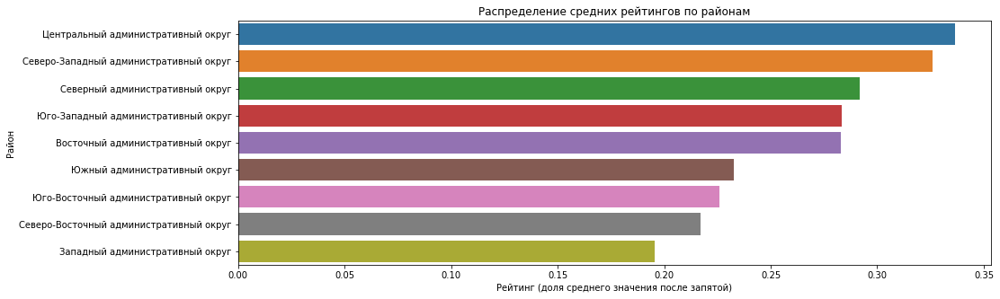

In [53]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x='share', y='district', data=t)
plt.title('Распределение средних рейтингов по районам')
plt.xlabel('Рейтинг (доля среднего значения после запятой)')
plt.ylabel('Район')

Самые высокие рейтинги у кофеен Центральном, Северно-Западном, Северном районах.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [54]:
t = data.query('category == "кофейня"')
t = t.query('middle_coffee_cup != 0')
t = t.groupby('district').agg({'middle_coffee_cup':'median'}).sort_values(by=('middle_coffee_cup'), ascending=False).reset_index()
t

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [55]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=t,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки кофе в кофейнях по районам',
).add_to(m)

# выводим карту
m

### Вывод

Всего в Москве 1413 кофеен.

Из них 59 кофеен - круглосуточные, 1339 - некруглосуточные.

Количество кофеен по районам распределилось следующим образом:
- Центральный административный округ	428
- Северный административный округ	193
- Северо-Восточный административный округ	159
- Западный административный округ	150
- Южный административный округ	131
- Восточный административный округ	105
- Юго-Западный административный округ	96
- Юго-Восточный административный округ	89
- Северо-Западный административный округ	62

Рейтинг кофеен по районам:
- Центральный административный округ	4.336449
- Северо-Западный административный округ	4.325806
- Северный административный округ	4.291710
- Юго-Западный административный округ	4.283333
- Восточный административный округ	4.282857
- Южный административный округ	4.232824
- Юго-Восточный административный округ	4.225843
- Северо-Восточный административный округ	4.216981
- Западный административный округ	4.195333

Медианная стоимость чашки кофе по районам:

- Юго-Западный административный округ	198.0
- Центральный административный округ	190.0
- Западный административный округ	189.0
- Северо-Западный административный округ	165.0
- Северо-Восточный административный округ	162.5
- Северный административный округ	159.0
- Южный административный округ	150.0
- Юго-Восточный административный округ	147.5
- Восточный административный округ	135.0

### Выбор места для инвестора

Воспользуемся советом по открытию кофеен от Coffee Like: "Изучите карту своего города. Взгляните на неё глазами арендатора: найдите места притяжения трафика, изучите точки скопления конкурентов. Особенное внимание обратите на площади у метро, зоны отдыха, остановки транспорта, учебные заведения. Также поищите на карте пустоты, где пока нет кофеен."


Согласно запросу инвестора - открыть такую же крутую и доступную, как «Central Perk», необходимо определить важные критерии для открытия кофейни.

Определим критерии согласно запросу инвестора:

1. Кофейня в центре города (как «Central Perk»)

Согласно первого пункта. Отбросим все округа, кроме Центрального. Согласно анализа, в Центральном округе больше всего кофеен (428 кофеен).

2. Популярная (крутая)

В Центральном округе самый высокий рейтинг кофеен - 4,3, что отвечает критерию популярности.

3. Доступная

Доступность обеспечит стоимость чашки кофе, которая не должна быть выше средней по району. Ранее мы определили, что Центральному административному округу соответствует медианная стоимость чашки кофе 190.0 р.

4. Возле парка (как «Central Perk»)

Посмотрим визуализацию на карте Москвы по Центральному административному округу. Исходя из совета, поищем на карте пустоты, где пока нет кофеен. 

Согласно tripadvisor.ru определим популярные места места для прогулок по Москве (Центральный округ (ЦАО) (Москва): лучшие Природа и парки (10 )):
- Александровский сад
- Парк "Зарядье"
- Центральный парк культуры и отдыха им. Горького
- ВДНХ
- Патриаршие пруды

Посмотрим на карте Москвы как распределились кофейни.

In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category == "кофейня" and district == "Центральный административный округ"').apply(create_clusters, axis=1)

# выводим карту
m

Изучим на карте места из списка:
- Александровский сад: 3 кофейни
- Парк "Зарядье": 1 кофейня
- Центральный парк культуры и отдыха им. Горького: 5 кофеен
- ВДНХ (за пределами ЦАО)
- Патриаршие пруды: 3 кофейни.   

### Вывод

1. Согласно проведенного анализа, можно сделать вывод, что наиболее подходящее место для открытия кофейни как «Central Perk» является Центральный парк культуры и отдыха им. Горького. 

Остальные места не достаточно масштабные по аналогии с Центральным Парком. Патриаршие пруды по масштабу значительно меньше Парка культуры и отдыха им. Горького, а количество кофеен в этом районе уже большое. ВДНХ находится за пределами ЦАО. А Александровский сад и парк Зарядье - центр города, возможно аренда и свободные места в данном месте будут несравнимо высокими и недоступными.

2. Дальнейшие рекомендации по помещению это: 

Небольшие кафе. Зал на четыре-пять столиков и кухня. В меню помимо кофе есть завтраки, десерты и закуски, которые подаются на керамической посуде.

Это универсальный формат: такие заведения открывают в центре, спальных районах и рядом с парками, где гуляют семьи с детьми, возле вузов и студенческих общежитий.

## Часть 5. Подготовка презентации

Презентация: <https://disk.yandex.ru/i/oQiGgtrsZ1f2xQ>